In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
import scipy
import matplotlib
from matplotlib import rcParams
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100
rcParams['pdf.fonttype'] = 42
sc.settings.figdir = './figures/figure2_S2/'
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 600, vector_friendly = True, format = 'pdf')

In [2]:
cd F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\

F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline


G:\Miniconda3\envs\omicverse\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [3]:
data_dir = '/PROJECTS/PROJECT_HUMAN_FETAL_COCHLEAE/WORKPLACE/R/sc_pipeline/'
meta = pd.read_csv(data_dir+'metadata.csv',index_col=0)
meta

         sample_id           donor  gw  gender 10xKit sequencing   dataset  \
sample                                                                       
9.5gw          gw9  not_provided_1   9  female    SC3  snRNA-seq    public   
11.2gw        gw11  not_provided_2  11    male    SC3  snRNA-seq    public   
14+3gw        gw14       F20240701  14    male    SC3  snRNA-seq  in-house   
15gw          gw15  not_provided_3  15  female    SC3  scRNA-seq    public   
16+4gw        gw16       F20241018  16    male    SC3  snRNA-seq  in-house   
17+2gw      gw17_1       F20220807  17    male    SC3  snRNA-seq  in-house   
17+3gw      gw17_2       F20240928  17  female    SC3  snRNA-seq  in-house   
17gw        gw17_3  not_provided_4  17    male    SC3  scRNA-seq    public   
18+3gw        gw18       F20220806  18    male    SC3  snRNA-seq  in-house   
20gw          gw20     F20240928-2  20  female    SC3  snRNA-seq  in-house   
22+2gw_1    gw22_1       F20241021  22    male    SC3  snRNA-seq

In [4]:
adata_new=sc.read('human_cochlea_annotation_add_40000genes.h5ad')

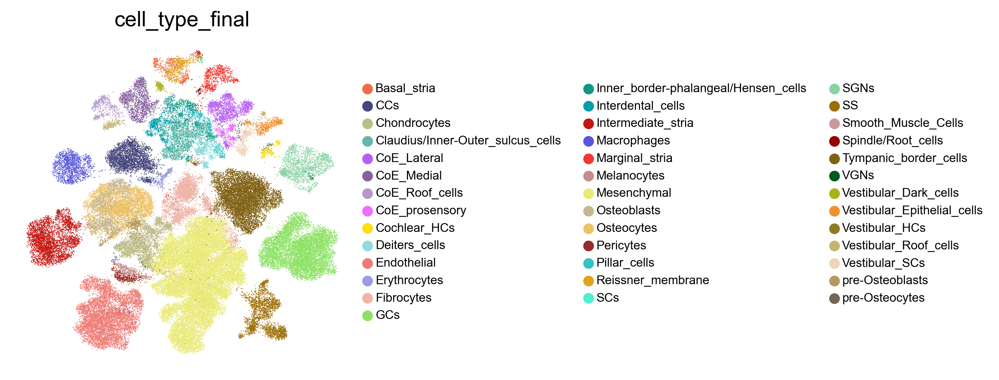

In [5]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_new, color=['cell_type_final'], wspace=0.5,ncols=1,save='_human_prenatal_cochlea.pdf',
           legend_fontsize=8,) #legend_loc='on data',

In [6]:
def Barplot(which_var, adata, var='clusters', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
#     ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
#                        dpi=300, orientation='landscape', format= 'pdf', optimize=True)

In [7]:
palette={"Erythrocytes": "#9a9ae8", #Circulating cells
             "Macrophages": "#5757dd",
             "CCs": "#45457f",

              "Tympanic_border_cells": "#806114",# Surrounding structures
            "Reissner_membrane": "#e0a31b",
             "pre-Osteoblasts": "#b59a5d",
             "pre-Osteocytes": "#726750",
             "Osteoblasts": "#c6b691",
             "Osteocytes": "#edc264",
             "SS": "#9e6e04",

             "Endothelial": "#ef7b75",# Lateral wall
             "Pericytes": "#992b28",
             "Smooth_Muscle_Cells": "#cc9997",
             "Marginal_stria": "#f23833",
             "Intermediate_stria": "#c61612",
             "Basal_stria": "#ef7048",
             "Spindle/Root_cells": "#930300",
             "Fibrocytes": "#efb4a8",

             "Interdental_cells": "#049eaa",# Supporting cells
              "Pillar_cells": "#32c3c6",
              "Deiters_cells": "#90dbdd",
              "Inner_border-phalangeal/Hensen_cells": "#0d9982",
              "Claudius/Inner-Outer_sulcus_cells": "#63b7a9",
              "SCs": "#50efd4",

              "Cochlear_HCs": "#ffde0d",# Hair cells
               "Vestibular_HCs": "#8e7c20",
             
             "Vestibular_SCs": "#efd6bb", # Vestibular
               "Vestibular_Epithelial_cells": "#f2902f",
             "Vestibular_Roof_cells": "#c4b470",
               "Vestibular_Dark_cells": "#abb21b",

             "CoE_Lateral": "#b85ff2", # early cochlear domain
               "CoE_Medial": "#8760a0",
             "CoE_Roof_cells": "#b597c9",
               "CoE_prosensory": "#ed6eff",

             "SGNs": "#89d3a4",# Neurons
               "VGNs": "#025921",
             "GCs": "#8ce264",# Glial cells

              "Mesenchymal": "#eaea78",
             "Chondrocytes": "#bcbc86",
               "Melanocytes": "#c68d8d",
       
            
            }

#### FIGURE S2a
##### cell-type composition

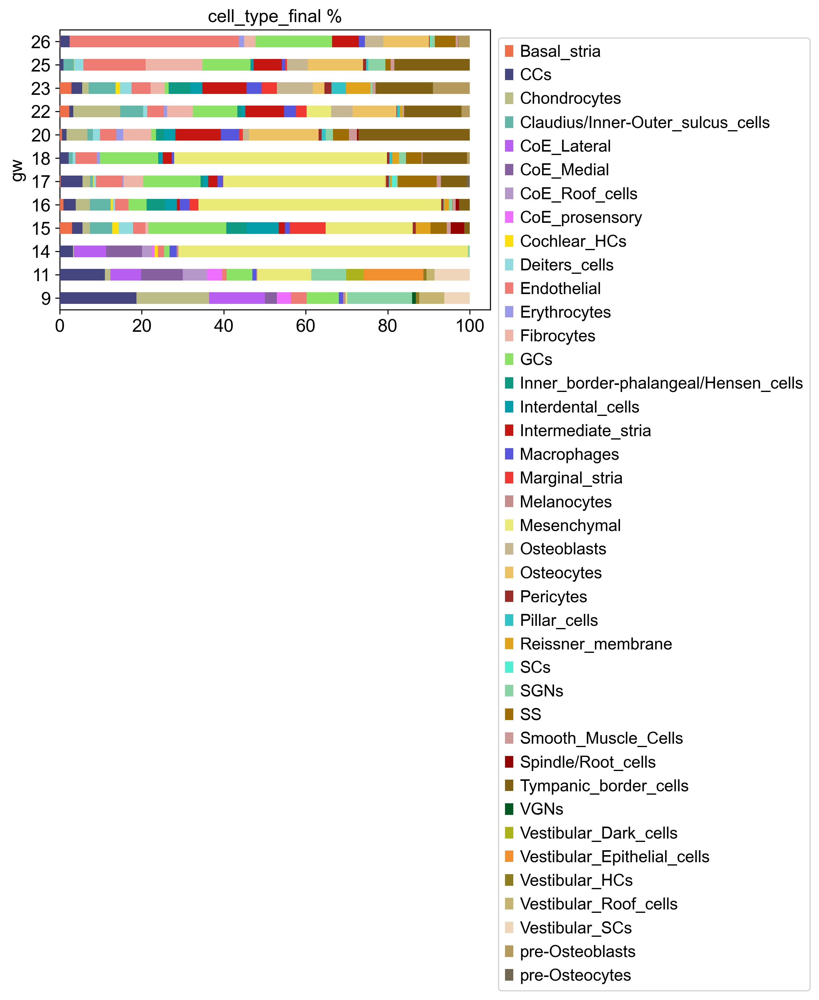

In [8]:
sc.set_figure_params(frameon=False,dpi=150,dpi_save=600)
Barplot('cell_type_final', adata_new, var='gw', height=4,color=palette,
       )
plt.savefig (data_dir+"figures/figure2_S2/Barplot_cell_type_porprotion.pdf", format="pdf", bbox_inches="tight")

#### FIGURE S2b
##### cell-type composition

In [9]:
adata_coe_raw=sc.read('human_cochlea_coe_annotation_add_40000genes.h5ad')

In [10]:
#subset cochlear epithelium cell-type cells
# extract cochlear epirhelium cell types 
adata_coe=adata_new[adata_new.obs['cell_type_final'].isin(['Claudius/Inner-Outer_sulcus_cells','CoE_Lateral','CoE_Medial',
                                                   'CoE_prosensory','Cochlear_HCs','Deiters_cells','Inner_border-phalangeal/Hensen_cells',
                                                  'Interdental_cells','Pillar_cells','SCs']
    
)]
adata_coe

View of AnnData object with n_obs × n_vars = 8113 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'species', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'm

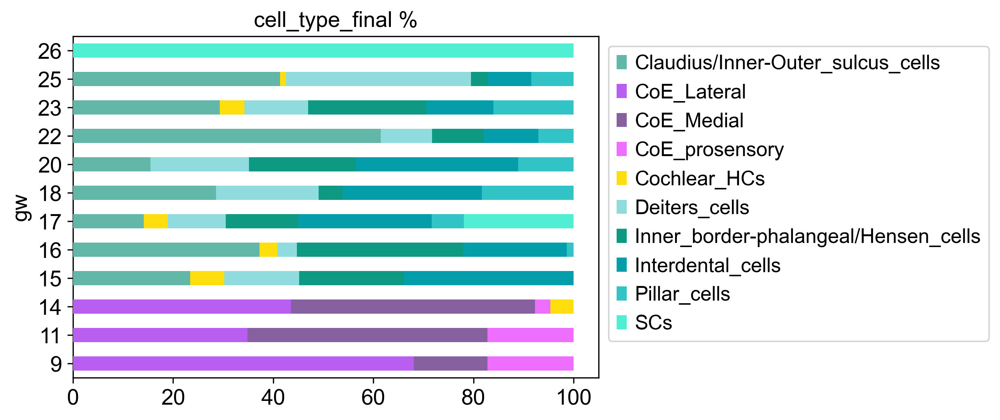

In [11]:
sc.set_figure_params(frameon=False,dpi=150,dpi_save=600)
Barplot('cell_type_final', adata_coe, var='gw', height=4,color=palette,
       )
plt.savefig (data_dir+"figures/figure2_S2/Barplot_cell_type_porprotion.pdf", format="pdf", bbox_inches="tight")

#### FIGURE S2c

In [12]:
adata_coe = sc.read(data_dir + 'human_coe_for_rename_cell_types.h5ad')
adata_coe

AnnData object with n_obs × n_vars = 8113 × 2000
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'low_ncounts', 'high_mito', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'leiden_res1.0', 'is_doublet_scrub', 'leiden_res1.1', 'leiden_res4.0', 'leiden_res2.0', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_scanvi_3.0', 'leiden_scanvi_4.0', 'cell_type_final', 'age_bins', 'cluster1', 'scANVI_res2.0', 'cell_type_final_v2'
    var: 'Gene', 'mt', 'gene_ids-0', 'feature_types-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0',

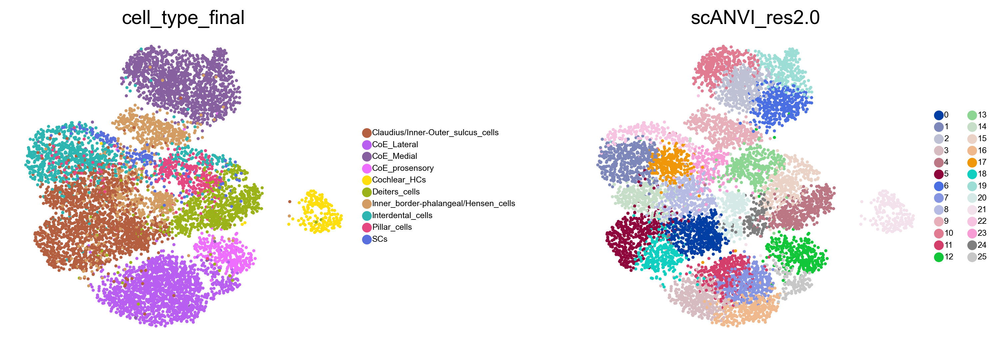

In [13]:
sc.set_figure_params(frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_coe, color=['cell_type_final','scANVI_res2.0',],
           size=20,
           legend_fontsize=6,ncols = 2,wspace = 0.5,save='_scanvi_coe.pdf',
           
          )
 #legend_loc='on data',

#### FIGURE S2e/f

In [14]:
cluster_annotation = {
 '2': 'CoE_Medial',
     '6': 'CoE_Medial',
     '10': 'CoE_Medial',
     '19': 'CoE_Medial',
   
     '9': 'Inner_border-phalangeal_cells',

     '12': 'CoE_prosensory',
     '25': 'CoE_prosensory',
    
    '1': 'Interdental_cells',
     '22': 'Interdental_cells',
     '17': 'Interdental_cells',
     '23': 'Interdental_cells',
   
    
    '13': 'Pillar_cells',
   
    '21': 'Cochlear_HCs',
  
    '4': 'Deiters_cells',
     '15': 'Deiters_cells',
     '24': 'Deiters_cells',
    
    '3': 'CoE_Lateral',
    '7': 'CoE_Lateral',
    '11': 'CoE_Lateral',
    '16': 'CoE_Lateral',
      
 
    '0': 'Claudius/Outer_sulcus_cells',
     '5': 'Claudius/Outer_sulcus_cells',
     '18': 'Claudius/Outer_sulcus_cells',
   
   
    '8': 'Inner_sulcus_cells',
     '14': 'Inner_sulcus_cells',
    
   
    '20': 'Hensen_cells',

}
adata_coe.obs['cell_type_final_v2'] = adata_coe.obs['scANVI_res2.0'].map(cluster_annotation).astype('category')

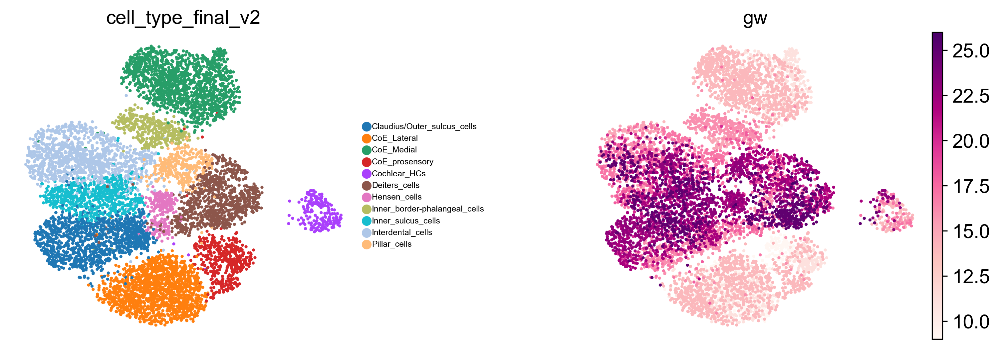

In [15]:
sc.set_figure_params(frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_coe, color=['cell_type_final_v2','gw',],
           size=20,
           legend_fontsize=6,ncols = 2,wspace = 0.5,save='_scanvi_coe3.pdf',
           
          )
 #legend_loc='on data',

In [16]:
adata_coe_v2=adata_new[adata_coe.obs.index]

In [17]:
#adata_new.layers['counts']=adata_integration.layers['counts']
adata_coe_v2.obsp['connectivities']=adata_coe.obsp['connectivities']
adata_coe_v2.obsp['distances']=adata_coe.obsp['distances']

adata_coe_v2.obsm['X_pca']=adata_coe.obsm['X_pca']
adata_coe_v2.obsm['X_scANVI']=adata_coe.obsm['X_scANVI']
adata_coe_v2.obsm['X_scVI']=adata_coe.obsm['X_scVI']
adata_coe_v2.obsm['X_umap']=adata_coe.obsm['X_umap']
adata_coe_v2.obsm['_scvi_extra_categorical_covs']=adata_coe.obsm['_scvi_extra_categorical_covs']
adata_coe_v2.obsm['_scvi_extra_continuous_covs']=adata_coe.obsm['_scvi_extra_continuous_covs']

adata_coe_v2.uns['_scvi_manager_uuid']=adata_coe.uns['_scvi_manager_uuid']
adata_coe_v2.uns['_scvi_uuid']=adata_coe.uns['_scvi_uuid']
adata_coe_v2.uns['annotation_colors']=adata_coe.uns['annotation_colors']
adata_coe_v2.uns['ccgs']=adata_coe.uns['ccgs']
adata_coe_v2.uns['cell_type_final_colors']=adata_coe.uns['cell_type_final_colors']
adata_coe_v2.uns['hvg']=adata_coe.uns['hvg']
adata_coe_v2.uns['leiden']=adata_coe.uns['leiden']
adata_coe_v2.uns['leiden_R']=adata_coe.uns['leiden_R']
adata_coe_v2.uns['leiden_R_colors']=adata_coe.uns['leiden_R_colors']
adata_coe_v2.uns['leiden_res2.0_colors']=adata_coe.uns['leiden_res2.0_colors']
adata_coe_v2.uns['leiden_res2.0']=adata_coe.uns['leiden_res2.0']
adata_coe_v2.uns['leiden_scanvi_2.0_colors']=adata_coe.uns['leiden_scanvi_2.0_colors']
adata_coe_v2.uns['log1p']=adata_coe.uns['log1p']
adata_coe_v2.uns['neighbors']=adata_coe.uns['neighbors']
adata_coe_v2.uns['sample_colors']=adata_coe.uns['sample_colors']
adata_coe_v2.uns['umap']=adata_coe.uns['umap']
adata_coe_v2.uns['scANVI_res2.0']=adata_coe.uns['scANVI_res2.0']
adata_coe_v2.uns['scANVI_res2.0_colors']=adata_coe.uns['scANVI_res2.0_colors']


adata_coe_v2.obs['cell_type_final']=adata_coe.obs['cell_type_final']
adata_coe_v2.obs['cell_type_final_v2']=adata_coe.obs['cell_type_final_v2']
adata_coe_v2.obs['low_ncounts']=adata_coe.obs['low_ncounts']
adata_coe_v2.obs['low_ncounts_high_mito']=adata_coe.obs['low_ncounts_high_mito']
adata_coe_v2.obs['S_score']=adata_coe.obs['S_score']
adata_coe_v2.obs['G2M_score']=adata_coe.obs['G2M_score']
adata_coe_v2.obs['phase']=adata_coe.obs['phase']
adata_coe_v2.obs['scrublet_score']=adata_coe.obs['scrublet_score']
adata_coe_v2.obs['scrublet_cluster_score']=adata_coe.obs['scrublet_cluster_score']
adata_coe_v2.obs['zscore']=adata_coe.obs['zscore']
adata_coe_v2.obs['bh_pval']=adata_coe.obs['bh_pval']
adata_coe_v2.obs['bonf_pval']=adata_coe.obs['bonf_pval']
adata_coe_v2.obs['is_doublet']=adata_coe.obs['is_doublet']
adata_coe_v2.obs['is_doublet_scrub']=adata_coe.obs['is_doublet_scrub']
adata_coe_v2.obs['_scvi_batch']=adata_coe.obs['_scvi_batch']
adata_coe_v2.obs['_scvi_labels']=adata_coe.obs['_scvi_labels']
adata_coe_v2.obs['leiden_scanvi_2.0']=adata_coe.obs['leiden_scanvi_2.0']
adata_coe_v2.obs['leiden_res2.0']=adata_coe.obs['leiden_res2.0']
adata_coe_v2.obs['scANVI_res2.0']=adata_coe.obs['scANVI_res2.0']

C:\Users\Dell\AppData\Local\Temp\ipykernel_17828\1371174389.py:2: ImplicitModificationWarning: Setting element `.obsp['connectivities']` of view, initializing view as actual.
  adata_coe_v2.obsp['connectivities']=adata_coe.obsp['connectivities']


In [18]:
sc.pp.normalize_per_cell(adata_coe_v2, counts_per_cell_after=1e4)
sc.pp.log1p(adata_coe_v2)

C:\Users\Dell\AppData\Local\Temp\ipykernel_17828\3566086680.py:1: FutureWarning: Use sc.pp.normalize_total instead
  sc.pp.normalize_per_cell(adata_coe_v2, counts_per_cell_after=1e4)


G:\Miniconda3\envs\omicverse\lib\site-packages\scanpy\preprocessing\_simple.py:590: FutureWarning: Use sc.pp.normalize_total instead
  normalize_per_cell(


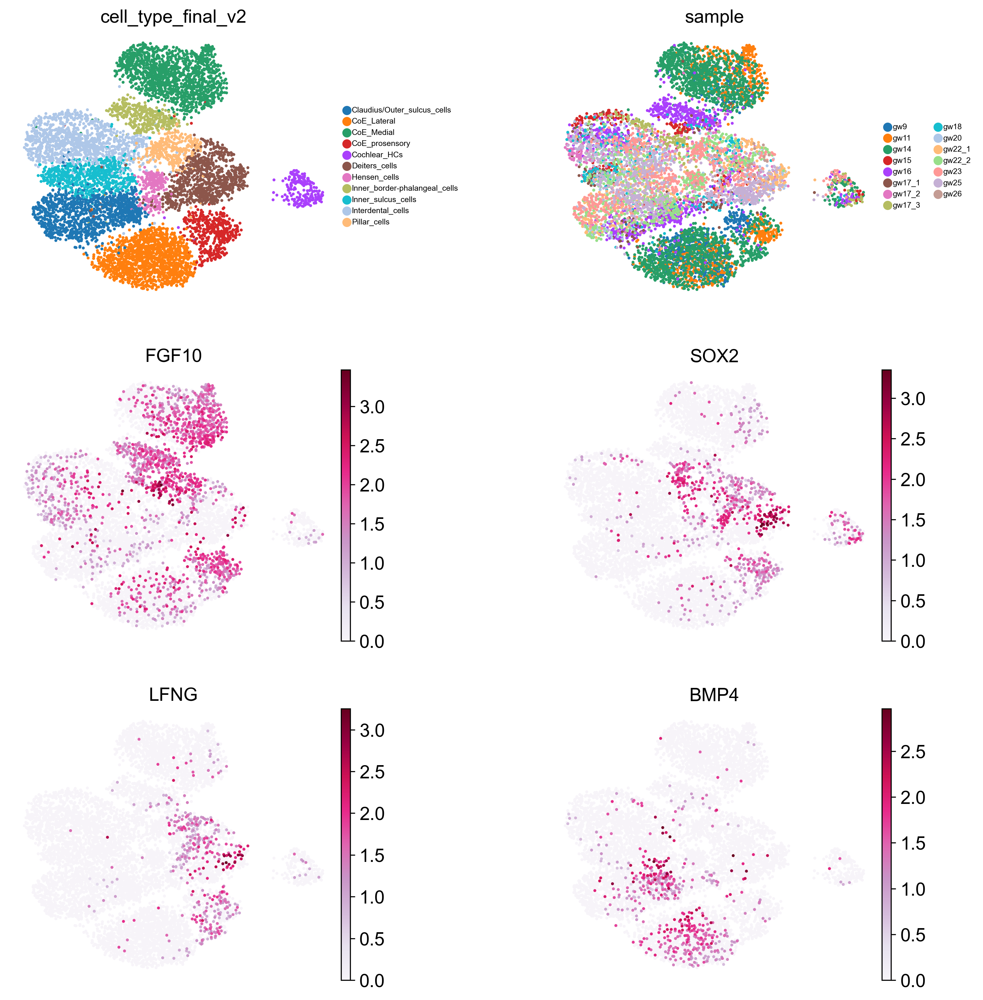

In [19]:
sc.set_figure_params(frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_coe_v2, color=['cell_type_final_v2','sample',
                               'FGF10','SOX2','LFNG','BMP4',
                               
                               
                               ],
           size=20,
           legend_fontsize=6,ncols = 2,wspace = 0.5,save='_scanvi_coe4.pdf',
           color_map = "PuRd",
          )
 #legend_loc='on data',

#### FIGURE S2g

In [32]:
#subset cochlear epithelium cell-type cells
# extract cochlear epirhelium cell types 
adata_coe=adata_new[adata_new.obs['cell_type_final'].isin(['Claudius/Inner-Outer_sulcus_cells','CoE_Lateral','CoE_Medial',
                                                   'CoE_prosensory','Cochlear_HCs','Deiters_cells','Inner_border-phalangeal/Hensen_cells',
                                                  'Interdental_cells','Pillar_cells','SCs']
    
)]
adata_coe

View of AnnData object with n_obs × n_vars = 8113 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'species', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'm

In [33]:
adata_sub=sc.read('human_coe_sub_for_trajectory_analysis_v4.h5ad')
adata_sub

AnnData object with n_obs × n_vars = 2388 × 13994
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'low_ncounts', 'high_mito', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'leiden_res1.0', 'is_doublet_scrub', 'leiden_res1.1', 'leiden_res4.0', 'leiden_res2.0', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_scanvi_3.0', 'leiden_scanvi_4.0', 'cell_type_final', 'cell_type_final_v2', 'scANVI_res2.0', 'cell_type_final_v4'
    var: 'Gene', 'mt', 'gene_ids-0', 'feature_types-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 

In [34]:
cluster_annotation = {
 'FGF20+SULF1+Medial_PSD': 'FGFR3+PROX1+Lateral_PSD',
     'TBX2+MEIS2+Early_PSD': 'TBX2+MEIS2+Early_PSD',
     'FGFR3+PROX1+Lateral_PSD': 'FGF20+SULF1+Medial_PSD',
     'Outer_HC': 'Outer_HC',
     'Inner_HC': 'Inner_HC',
     'LGR6+TMPRSS3+_PC': 'LGR6+TMPRSS3+_PC',
    'LGR6+TMPRSS3+_PC': 'LGR6+TMPRSS3+_PC',
    'PPP1R2+HIST1H2AC+_PC': 'PPP1R2+HIST1H2AC+_PC',
     'ISL1+ST3GAL1+IBC_IPhC': 'ISL1+ST3GAL1+IBC_IPhC',
    'FOXG1+RELN+IBC_IPhC': 'FOXG1+RELN+IBC_IPhC',
     'SPOCK1+PEX5L+IBC_IPhC': 'SPOCK1+PEX5L+IBC_IPhC',
    'SLC24A3+ZBTB20+IBC_IPhC': 'SLC24A3+ZBTB20+IBC_IPhC',
     'SERPINE2+JAG1+DC': 'SERPINE2+JAG1+DC',
    'PTGDS+CEMIP+DC': 'PTGDS+CEMIP+DC',
     'EGFR+ELMO1+HEC': 'EGFR+ELMO1+HEC',
    'FST+AFF3+HEC': 'FST+AFF3+HEC',
}
adata_sub.obs['cell_type_final_v4'] = adata_sub.obs['cell_type_final_v4'].map(cluster_annotation).astype('category')

In [35]:
cluster_annotation = {
    'FGFR3+PROX1+Lateral_PSD': 'CoE_prosensory',
    'FGF20+SULF1+Medial_PSD':'CoE_prosensory',
     'TBX2+MEIS2+Early_PSD': 'CoE_prosensory',
     'Outer_HC': 'Cochlear_HCs',
     'Inner_HC': 'Cochlear_HCs',
     'LGR6+TMPRSS3+_PC': 'Pillar_cells',
    'LGR6+TMPRSS3+_PC': 'Pillar_cells',
    'PPP1R2+HIST1H2AC+_PC': 'Pillar_cells',
     'ISL1+ST3GAL1+IBC_IPhC': 'Inner_border-phalangeal_cells',
    'FOXG1+RELN+IBC_IPhC': 'Inner_border-phalangeal_cells',
     'SPOCK1+PEX5L+IBC_IPhC': 'Inner_border-phalangeal_cells',
    'SLC24A3+ZBTB20+IBC_IPhC': 'Inner_border-phalangeal_cells',
     'SERPINE2+JAG1+DC': 'Deiters_cells',
    'PTGDS+CEMIP+DC': 'Deiters_cells',
     'EGFR+ELMO1+HEC': 'Hensen_cells',
    'FST+AFF3+HEC': 'Hensen_cells',
}
adata_sub.obs['cell_type_final_v3'] = adata_sub.obs['cell_type_final_v4'].map(cluster_annotation).astype('category')

In [36]:
cluster_annotation = {
    'FGFR3+PROX1+Lateral_PSD': 'Lateral_PSD',
    'FGF20+SULF1+Medial_PSD':'Medial_PSD',
     'TBX2+MEIS2+Early_PSD': 'Early_PSD',
     'Outer_HC': 'Cochlear_HCs',
     'Inner_HC': 'Cochlear_HCs',
     'LGR6+TMPRSS3+_PC': 'Pillar_cells',
    'LGR6+TMPRSS3+_PC': 'Pillar_cells',
    'PPP1R2+HIST1H2AC+_PC': 'Pillar_cells',
     'ISL1+ST3GAL1+IBC_IPhC': 'Inner_border-phalangeal_cells',
    'FOXG1+RELN+IBC_IPhC': 'Inner_border-phalangeal_cells',
     'SPOCK1+PEX5L+IBC_IPhC': 'Inner_border-phalangeal_cells',
    'SLC24A3+ZBTB20+IBC_IPhC': 'Inner_border-phalangeal_cells',
     'SERPINE2+JAG1+DC': 'Deiters_cells',
    'PTGDS+CEMIP+DC': 'Deiters_cells',
     'EGFR+ELMO1+HEC': 'Hensen_cells',
    'FST+AFF3+HEC': 'Hensen_cells',
}
adata_sub.obs['cell_type_final_v5'] = adata_sub.obs['cell_type_final_v4'].map(cluster_annotation).astype('category')

In [37]:
adata_coe_raw=adata_new[adata_sub.obs.index]
adata_coe_raw

View of AnnData object with n_obs × n_vars = 2388 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'species', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'm

In [38]:
adata_coe_raw.obs['cell_type_final_v3']=adata_sub.obs['cell_type_final_v3']
adata_coe_raw.obs['cell_type_final_v4']=adata_sub.obs['cell_type_final_v4']
adata_coe_raw.obs['cell_type_final_v5']=adata_sub.obs['cell_type_final_v5']

C:\Users\Dell\AppData\Local\Temp\ipykernel_17828\3017807369.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_coe_raw.obs['cell_type_final_v3']=adata_sub.obs['cell_type_final_v3']


In [39]:
adata_coe_raw.obsm['X_pca']=adata_sub.obsm['X_pca']
adata_coe_raw.obsm['X_scANVI']=adata_sub.obsm['X_scANVI']
adata_coe_raw.obsm['X_scVI']=adata_sub.obsm['X_scVI']
adata_coe_raw.obsm['X_umap']=adata_sub.obsm['X_umap']

In [24]:
#subset cochlear epithelium cell-type cells
# extract cochlear epirhelium cell types 
adata_coe_ves=adata_new[adata_new.obs['cell_type_final'].isin(['Claudius/Inner-Outer_sulcus_cells','CoE_Lateral','CoE_Medial',
                                                   'CoE_prosensory','Cochlear_HCs','Deiters_cells','Inner_border-phalangeal/Hensen_cells',
                                                  'Interdental_cells','Pillar_cells','SCs','CoE_Roof_cells',
                                                               'Vestibular_Dark_cells','Vestibular_Epithelial_cells',
                                                               'Vestibular_Roof_cells','Vestibular_SCs',
                                                              'Vestibular_HCs',
                                                              
                                                              ]
    
)]
adata_coe_ves

View of AnnData object with n_obs × n_vars = 10149 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'species', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'cell_type_final', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_res2.0'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', '

In [25]:
adata_coe_ves.obs['cell_type_final'] = adata_coe_ves.obs['cell_type_final'].cat.reorder_categories([
'CoE_Lateral','CoE_Medial','CoE_Roof_cells','CoE_prosensory','Cochlear_HCs','Vestibular_HCs',
    'SCs','Pillar_cells','Deiters_cells','Interdental_cells',
    'Claudius/Inner-Outer_sulcus_cells', 'Inner_border-phalangeal/Hensen_cells',                                             
                                                               'Vestibular_Dark_cells',
    'Vestibular_Epithelial_cells',
                                                               'Vestibular_Roof_cells','Vestibular_SCs',
])

C:\Users\Dell\AppData\Local\Temp\ipykernel_17828\4044560913.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_coe_ves.obs['cell_type_final'] = adata_coe_ves.obs['cell_type_final'].cat.reorder_categories([


In [27]:
small_marker_dict={
 'Vestibular/Dorsal Markers':["DLX5","MSX1","GPR155","UBE2C","PCDH20","NEUROD6","WNT3A","HMX3",],
   
    'Cochlear/Ventral Markers':[ "NR2F2","NR2F1","GATA3","INSM1","HES6","TMPRSS3","FGFR3","LGR5",],
    'Cochlear duct floor prosensory':[ "RORB","ISL1","LGR5",],
'SHH Signaling':['SULF1',"LRP2",'GAS1','PTCH1'],
    'Hair cell Markers':[ "ATOH1","CCER2","KCNH6","GRXCR2","MYO7A","LHX3","POU4F3",],
    'Otic Markers':[ "EPCAM","FBXO2",],
    
}
# check if the markers are in the data
smarker_genes_in_data = dict()
for ct, markers in small_marker_dict.items():
    markers_found = list()
    for marker in markers:
        if marker in adata_coe_ves.var.index:
            markers_found.append(marker)
    smarker_genes_in_data[ct] = markers_found
#del [] # remove the last marker
del_markers = list()
for ct, markers in smarker_genes_in_data.items():
    if markers==[]:
        del_markers.append(ct)
for ct in del_markers:
    del smarker_genes_in_data[ct]

In [29]:
sc.pp.normalize_per_cell(adata_coe_ves, counts_per_cell_after=1e4)
sc.pp.log1p(adata_coe_ves)

C:\Users\Dell\AppData\Local\Temp\ipykernel_17828\1865859512.py:1: FutureWarning: Use sc.pp.normalize_total instead
  sc.pp.normalize_per_cell(adata_coe_ves, counts_per_cell_after=1e4)


G:\Miniconda3\envs\omicverse\lib\site-packages\scanpy\preprocessing\_simple.py:590: FutureWarning: Use sc.pp.normalize_total instead
  normalize_per_cell(


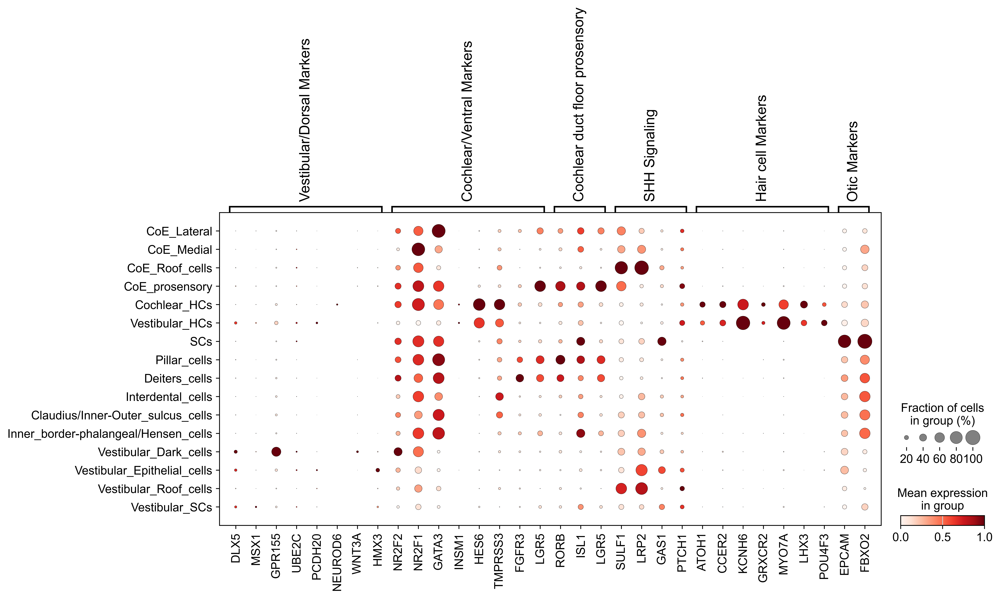

In [30]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=300,dpi_save=600)
#sc.tl.dendrogram(adata, groupby='cell_type_final')
sc.pl.dotplot(
    adata_coe_ves,
    groupby="cell_type_final",
    var_names=smarker_genes_in_data,
  # dendrogram=True,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
     save="_human_prenatal_cochlea_vestibular_markers.pdf"
)

#### FIGURE S2h

In [42]:
sc.pp.normalize_per_cell(adata_coe_raw, counts_per_cell_after=1e4)
sc.pp.log1p(adata_coe_raw)

C:\Users\Dell\AppData\Local\Temp\ipykernel_17828\2635887670.py:1: FutureWarning: Use sc.pp.normalize_total instead
  sc.pp.normalize_per_cell(adata_coe_raw, counts_per_cell_after=1e4)


G:\Miniconda3\envs\omicverse\lib\site-packages\scanpy\preprocessing\_simple.py:590: FutureWarning: Use sc.pp.normalize_total instead
  normalize_per_cell(


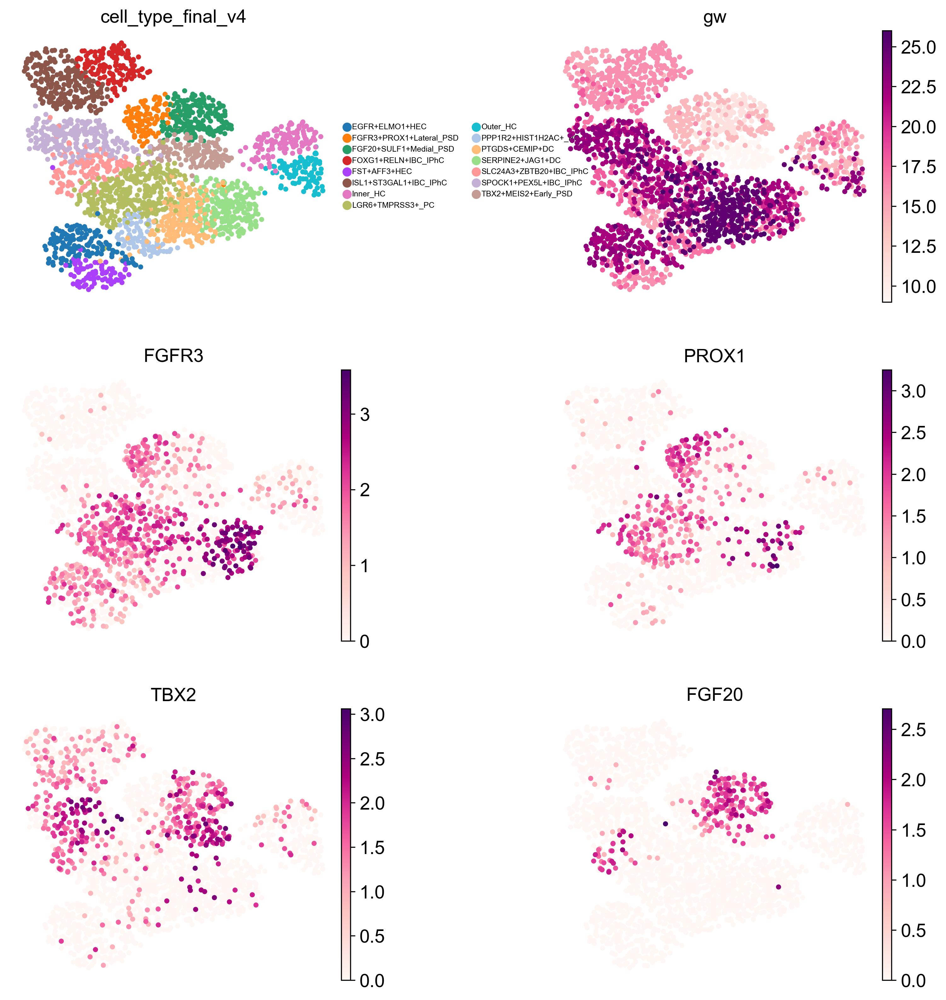

In [43]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_coe_raw, color=['cell_type_final_v4','gw', 
                                'FGFR3','PROX1', 'TBX2','FGF20',
                               
                            ],
           size=60,
           legend_fontsize=6,ncols = 2,wspace = 0.5,
           color_map = 'RdPu', save='_human_cochlea_REAME_COE.pdf',
           
          )

#### FIGURE S2j

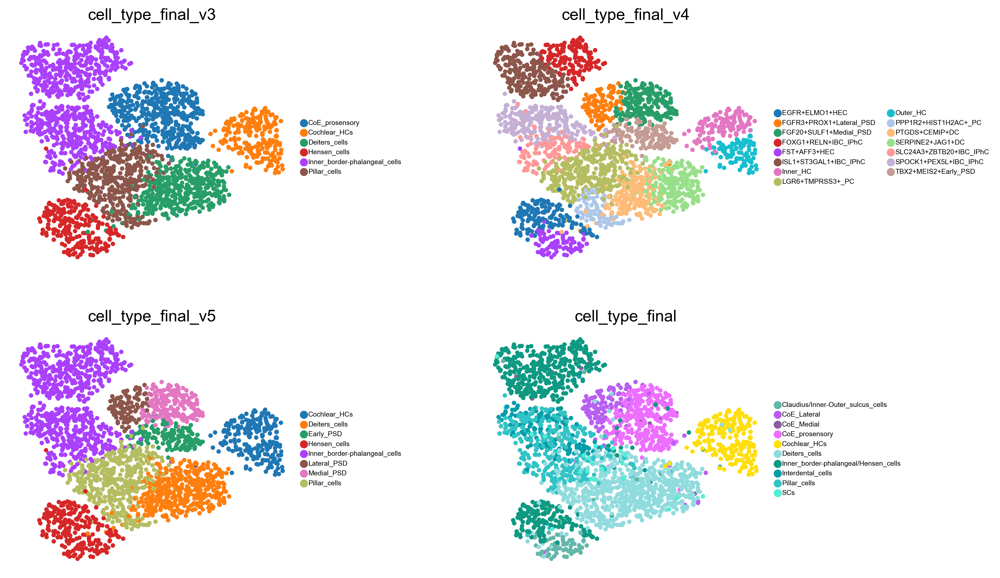

In [46]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_coe_raw, color=['cell_type_final_v3','cell_type_final_v4', 
                                'cell_type_final_v5',
                               'cell_type_final',
                            ],
           size=60,
           legend_fontsize=6,ncols = 2,wspace = 0.5,
           color_map = 'RdPu', save='_human_cochlea_REAME_COE_v2.pdf',
           
          )